In [115]:
#imports

import sklearn
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
import seaborn as sns
import re
import pyarrow.parquet as pa
import contractions
from wordcloud import WordCloud
import nltk
from nltk.tokenize import word_tokenize
import lime
import lime.lime_text
from lime.lime_text import LimeTextExplainer


nltk.download('punkt_tab')




[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [18]:
#Reading the dataset and displaying it
data = pd.read_parquet('train-00000-of-00001-a0f92f8fbc6b2308.parquet')
print(data.columns)
print(data.info())



Index(['text', 'language_code'], dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33883 entries, 0 to 33882
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   text           33883 non-null  object
 1   language_code  33883 non-null  object
dtypes: object(2)
memory usage: 529.6+ KB
None


In [19]:
#Changing the data from parquet to csv 
data.to_csv('dataset.csv', index=False)
data = pd.read_csv('dataset.csv')

In [20]:

def clean_text(text):
    if isinstance(text, str):
     

        # Remove special characters and digits, but preserve all alphabetic characters
        
        text = re.sub(r'[^a-zA-ZáéíóúüñÁÉÍÓÚÜÑа-яА-ЯёЁ\u4e00-\u9fff\uac00-\ud7af\u3040-\u30ff\u3130-\u318f\s]', '', text)
        
        # Remove extra whitespace
        text = text.strip()
        # Expand contractions
        text = contractions.fix(text)
        
        return text
    else:
        return ""

# Step 2: Apply the cleaning function to the 'text' column
data['cleaned_text'] = data['text'].apply(clean_text)

# Step 3: Remove NaN rows
data.dropna(subset=['cleaned_text'], inplace=True)

# Step 4: Tokenization (split the cleaned text into words)
def tokenize_text(text):
    return word_tokenize(text.lower())  # Tokenize and make lowercase for standardization

data['tokens'] = data['cleaned_text'].apply(tokenize_text)



In [21]:
# Step 5: Encode the 'language' column using LabelEncoder
label_encoder = LabelEncoder()
data['language_encoded'] = label_encoder.fit_transform(data['language_code'])

# Step 6: Print the mapping of original labels to numeric labels
print("Mapping:", dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_))))

# Step 7: Print the DataFrame with language and encoded labels
print(data[['language_code', 'language_encoded']])

# Step 8: Optional - Inverse transformation: converting encoded values back to original labels
inverse_labels = label_encoder.inverse_transform(data['language_encoded'])
print("Inverse transformation result:", inverse_labels)

Mapping: {'de': 0, 'en': 1, 'es': 2, 'fr': 3, 'it': 4, 'nl': 5, 'pl': 6, 'pt': 7, 'ru': 8, 'zh-TW': 9}
      language_code  language_encoded
0                pt                 7
1                pl                 6
2                pt                 7
3                ru                 8
4                nl                 5
...             ...               ...
33878            nl                 5
33879            pt                 7
33880            it                 4
33881            it                 4
33882            it                 4

[33883 rows x 2 columns]
Inverse transformation result: ['pt' 'pl' 'pt' ... 'it' 'it' 'it']


In [22]:
data.to_csv('cleaned_dataset.csv', index=False)
print("Cleaned dataset saved as 'cleaned_dataset.csv'")
print(data.info())
print(data.columns)
data.head(n=15)

Cleaned dataset saved as 'cleaned_dataset.csv'
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33883 entries, 0 to 33882
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   text              33883 non-null  object
 1   language_code     33883 non-null  object
 2   cleaned_text      33883 non-null  object
 3   tokens            33883 non-null  object
 4   language_encoded  33883 non-null  int32 
dtypes: int32(1), object(4)
memory usage: 1.2+ MB
None
Index(['text', 'language_code', 'cleaned_text', 'tokens', 'language_encoded'], dtype='object')


,text,language_code,cleaned_text,tokens,language_encoded
0,Fluoretos binários de metalóides e não-metais ...,pt,Fluoretos binários de metalóides e nometais de...,"[fluoretos, binários, de, metalóides, e, nomet...",7
1,Policja w Birmie postawiła Aung San Suu Kyi dw...,pl,Policja w Birmie postawia Aung San Suu Kyi dwa...,"[policja, w, birmie, postawia, aung, san, suu,...",6
2,Ter sistemas de armas nucleares em alerta máxi...,pt,Ter sistemas de armas nucleares them alerta má...,"[ter, sistemas, de, armas, nucleares, them, al...",7
3,"Взрыв 74+19+16! Дюрэнт и Харден сошли с ума, о...",ru,Взрыв Дюрэнт и Харден сошли с ума оба установ...,"[взрыв, дюрэнт, и, харден, сошли, с, ума, оба,...",8
4,Ze had slechts één voorwaarde: dat het boek pa...,nl,Ze had slechts één voorwaarde dat het boek pas...,"[ze, had, slechts, één, voorwaarde, dat, het, ...",5
5,Narendra Modi belooft een harde houding tegeno...,nl,Narendra Modi belooft een harde houding tegeno...,"[narendra, modi, belooft, een, harde, houding,...",5
6,"Kang Young-hoon (,), South Korean Army Lieuten...",en,Kang Younghoon South Korean Army Lieutenant G...,"[kang, younghoon, south, korean, army, lieuten...",1
7,¿Por qué la deducción no tiene éxito? El saldo...,es,Por qué la deducción no tiene éxito El saldo e...,"[por, qué, la, deducción, no, tiene, éxito, el...",2
8,Kobieta trzyma w ramionach małego kangura.,pl,Kobieta trzyma w ramionach maego kangura,"[kobieta, trzyma, w, ramionach, maego, kangura]",6
9,O castelo foi remodelado duas vezes: primeiro ...,pt,O castelo foi remodelado duas vezes primeiro n...,"[o, castelo, foi, remodelado, duas, vezes, pri...",7


In [23]:
# Ensure 'text' column contains cleaned text data
# Assuming the column you are using for text is named 'text' in your dataframe
# If you need to adjust this column name, modify 'df['text']'

# Initialize TfidfVectorizer with trigram (n=3) as n-gram range
vectorizer = TfidfVectorizer(max_features = 5000)  # Trigrams (n=3)

# Fit and transform the text data
X = vectorizer.fit_transform(data['cleaned_text'])  # 'text' column containing the cleaned text data

# Convert the sparse matrix to a dense format to view the results

# Optionally, check the shape of the matrix (rows = documents, columns = features)
print({X.shape})



{(33883, 5000)}


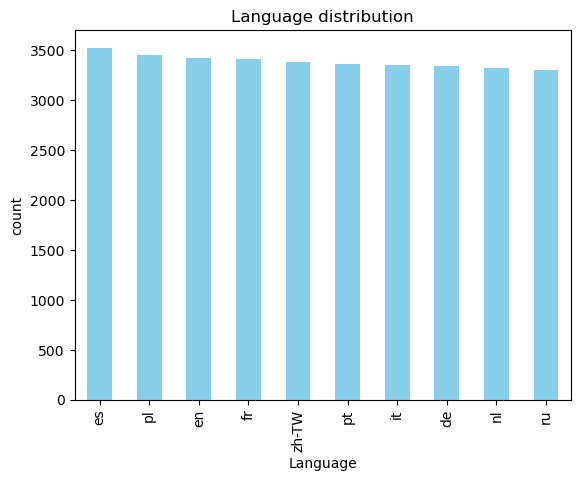

In [24]:
#Exploratory data analysis EDA
data['language_code'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Language distribution')
plt.xlabel('Language')
plt.ylabel('count')
plt.show()

In [25]:
data.isnull().sum()

text                0
language_code       0
cleaned_text        0
tokens              0
language_encoded    0
dtype: int64

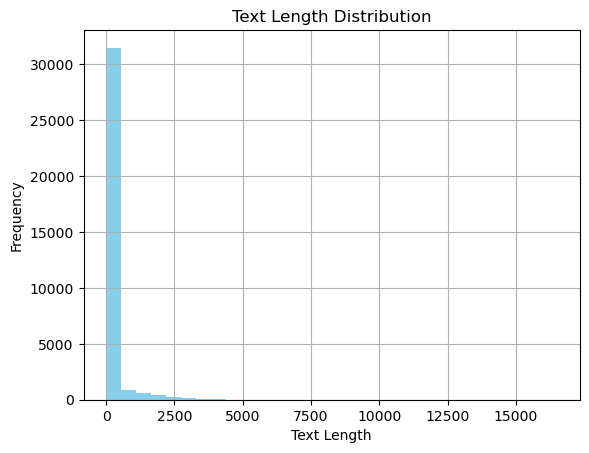

In [26]:
data['text_length'] = data['cleaned_text'].apply(len)  
data['text_length'].hist(color='skyblue', bins=30)
plt.title('Text Length Distribution')
plt.xlabel('Text Length')
plt.ylabel('Frequency')
plt.show()

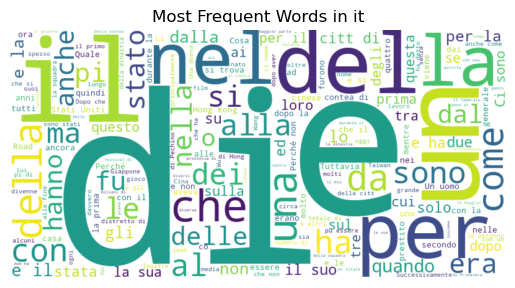

In [27]:
for lang in data['language_code'].unique():  # Loop over each unique language in the 'language' column
    # Filter the data for the current language
    lang_data = data[data['language_code'] == lang]
    wordcloud = WordCloud(width=800, height=400, colormap= 'viridis', background_color='white').generate(' '.join(lang_data['cleaned_text']))  # Adjust 'cleaned_text' if your column has a different name
plt.imshow(wordcloud, interpolation='bilinear')  # 'bilinear' interpolation for smoother edges
plt.axis('off')  # Turn off the axis
plt.title(f'Most Frequent Words in {lang}')  # Title with the language name
plt.show()  # Show the wordcloud for the current language

In [50]:
#splitting the dataset
X_train, X_test, y_train, y_test = train_test_split(
    X, data['language_encoded'], test_size=0.2, random_state=42
)

In [52]:

#training with naive bias model
nb_model = MultinomialNB()
nb_model.fit(X_train, y_train)

MultinomialNB()

In [54]:
#Evaluating the model and predicting on the test
y_pred = nb_model.predict(X_test)

#Calculating the scores
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred, target_names=label_encoder.classes_)

print("Accuracy:", accuracy)
print("Classification Report:\n", report)

Accuracy: 0.8604102110078206
Classification Report:
               precision    recall  f1-score   support

          de       0.99      0.97      0.98       670
          en       0.96      0.98      0.97       672
          es       0.44      0.98      0.61       692
          fr       1.00      0.98      0.99       690
          it       0.98      0.98      0.98       668
          nl       0.98      0.98      0.98       665
          pl       0.99      0.92      0.95       702
          pt       0.97      0.97      0.97       667
          ru       1.00      0.89      0.94       644
       zh-TW       0.36      0.01      0.01       707

    accuracy                           0.86      6777
   macro avg       0.87      0.86      0.84      6777
weighted avg       0.86      0.86      0.83      6777



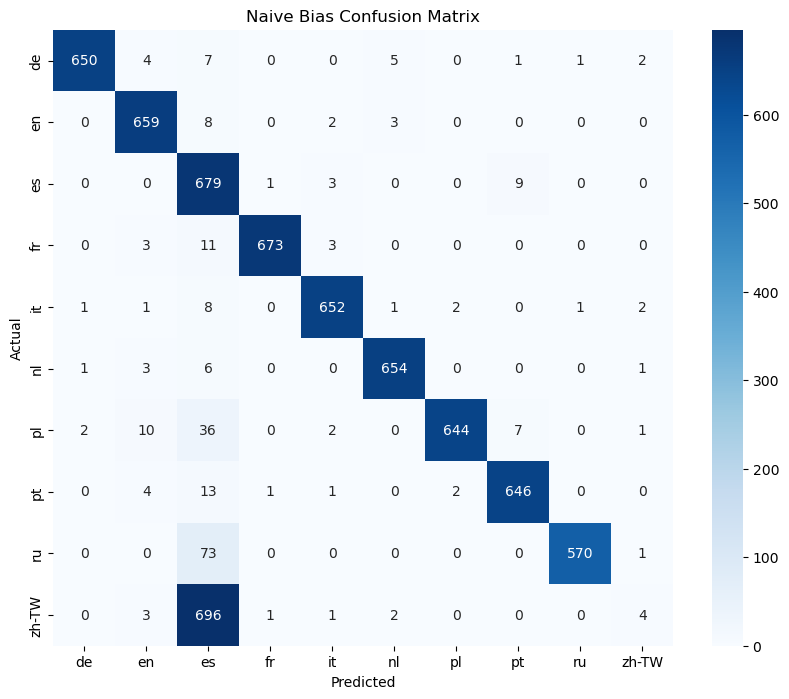

In [113]:
#Confusion matrix visualization
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title('Naive Bias Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [123]:
# Training an SVM Model
svc_model = SVC(kernel='linear',probability=True, C=1.0, random_state=42)
svc_model.fit(X_train, y_train)


SVC(kernel='linear', probability=True, random_state=42)

In [125]:
#Evaluate the SVM Model
# Predict on the test set
y_pred_svc = svc_model.predict(X_test)

# Calculate accuracy and classification report for SVM
accuracy_svc = accuracy_score(y_test, y_pred_svc)
report_svc = classification_report(y_test, y_pred_svc, target_names=label_encoder.classes_)

print("SVM Accuracy:", accuracy_svc)
print("SVM Classification Report:\n", report_svc)

SVM Accuracy: 0.9430426442378633
SVM Classification Report:
               precision    recall  f1-score   support

          de       0.99      0.94      0.97       670
          en       0.95      0.96      0.95       672
          es       0.98      0.94      0.96       692
          fr       0.99      0.95      0.97       690
          it       0.98      0.95      0.97       668
          nl       0.99      0.97      0.98       665
          pl       0.96      0.89      0.93       702
          pt       0.95      0.97      0.96       667
          ru       1.00      0.86      0.92       644
       zh-TW       0.73      0.99      0.84       707

    accuracy                           0.94      6777
   macro avg       0.95      0.94      0.95      6777
weighted avg       0.95      0.94      0.95      6777



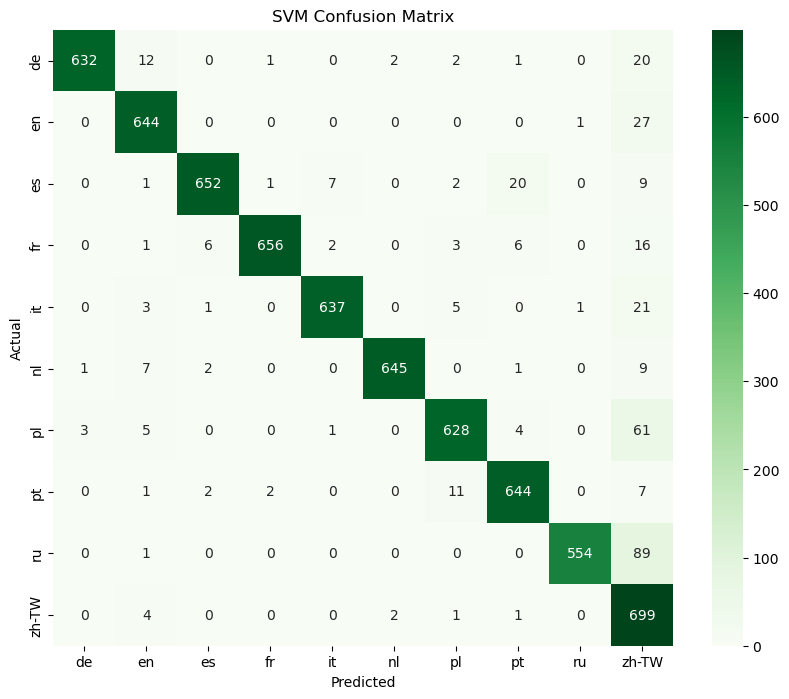

In [126]:
# Confusion Matrix for SVM
conf_matrix_svc = confusion_matrix(y_test, y_pred_svc)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_svc, annot=True, fmt='d', cmap='Greens', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title('SVM Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


In [144]:
test_data = data = pd.read_csv('test_dataset.csv')


new_features = vectorizer.transform(test_data['cleaned_text'])

predictions_svc = svc_model.predict(new_features)
decoded_predictions_svc = label_encoder.inverse_transform(predictions_svc)
print("SVM Predicted Languages:", decoded_predictions_svc)


# Predictions using Naive Bayes
predictions_nb = nb_model.predict(new_features)
decoded_predictions_nb = label_encoder.inverse_transform(predictions_nb)
print("Naive Bayes Predicted Languages:", decoded_predictions_nb)


SVM Predicted Languages: ['pt' 'de' 'pl' ... 'pl' 'nl' 'pl']
Naive Bayes Predicted Languages: ['pt' 'de' 'pl' ... 'pl' 'nl' 'pl']


In [151]:
explainer = LimeTextExplainer(class_names=label_encoder.classes_)

# Loop through the first 10 cleaned text samples and explain each prediction
for i, text in enumerate(test_data['cleaned_text'][:10]):  # Loop over first 10 cleaned texts
    explanation = explainer.explain_instance(
        text_instance=text,
        classifier_fn=lambda x: svc_model.predict_proba(vectorizer.transform(x)),
        num_features=10
    )
    print(f"Explanation for text: '{text}'")  # Use 'text' here, not 'new_texts[i]'
    explanation.show_in_notebook()  # This will display the LIME explanation in a Jupyter notebook, use .show() if running elsewhere

# Step 17: Save Cleaned Data for Reproducibility
data.to_csv('cleaned_dataset.csv', index=False)


Explanation for text: 'O Dow Jones Industrial Average subiu  para  e o índice Nasdaq Composite subiu  para'


Explanation for text: 'Der Bau des neuen Stadions dauerte vier Jahre und wurde am  August  eingeweiht'


Explanation for text: 'Trzsienie ziemi w Chinach Ronie liczba ofiar miertelnych'


Explanation for text: 'cos il peptide c'


Explanation for text: 'An diesem Deal wird seit mehreren Jahren gearbeitet'


Explanation for text: 'The dangerous cancer that killed Uncle Da  months after diagnosis was particularly preferred to  highrisk groups Have you taken precautions'


Explanation for text: 'Zasada wybuchu bomby atomowej jest'


Explanation for text: 'Eoacmaea calamus is een soort zeeslak een echte zeeslak een marien buikpotig weekdier uit de familie Eoacmaeidae en een van de echte zeeslakken'


Explanation for text: 'W wypadku belgijskiego autokaru zgino  osób'


Explanation for text: 'Schauen Sie sich das Bild unten an Was ist das Erste was Sie sehen Jiangcheng das Stadtzentrum in einer einzigen Wohnung in der Ziwei Community Als der erste Sonnenstrahl am Morgen durch das Glas ins Schlafzimmer schien ffnete Henry Zhang benommen die Augen und stellte fest dass er in einem fremden Raum lag Wo ist das Er sah sich um Dies ist eine kleine Einzelwohnung Die Dekoration des Hauses ist sehr exquisit Neben dem Bett steht eine groe Braunbrenpuppe Warum bist du hier Henry Zhang rieb sich den brennenden Kopf und erinnerte sich vage daran was letzte Nacht passiert war Gestern Abend war er mit einem Elektrofahrrad unterwegs um Lebensmittel für den Laden auszuliefern wurde dabei von einem roten Auto angefahren das pltzlich auf der Strae auftauchte und verlor daraufhin das Bewusstsein Henry Zhang stützte seinen Krper ab und sprang aus dem Bett aber seine ausgestreckte Hand berührte etwas Weiches und Dünnes h Was ist das Seltsamerweise hob er den weichen dünnen